In [80]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import ipywidgets 
from ipywidgets import interact, interactive,fixed,interact_manual
import plotly.express as px


In [81]:
df=pd.read_csv('stage3.csv') ##
zip_code=pd.read_csv('zip_code_crawler.csv')

/Users/dannyqiu/anaconda3/envs/DataViz/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3145: DtypeWarning:

Columns (33) have mixed types.Specify dtype option on import or set low_memory=False.



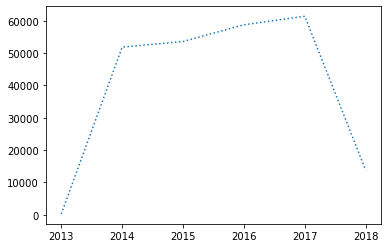

In [82]:
df['year']=pd.DatetimeIndex(df['date']).year
df['month']=pd.DatetimeIndex(df['date']).month
year=df.groupby('year').size()
plt.plot(year, linestyle = 'dotted')
plt.show()

In [87]:
df[df['date']=='2015-07-04'].count()

incident_id                 211
date                        211
state                       211
city_or_county              211
n_killed                    211
n_injured                   211
year                        211
participant_gender          191
participant_status          196
month                       211
incident_characteristics    211
dtype: int64

In [88]:

df=df[['incident_id','date','state','city_or_county','n_killed',
                   'n_injured','year','participant_gender','participant_status','month','incident_characteristics']]
## We only need few columns in below analyst, so extract those columns we need.


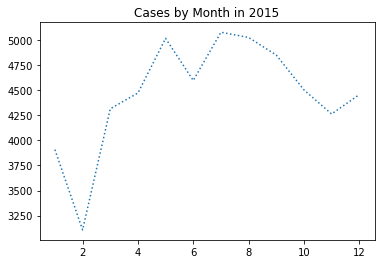

In [89]:
df_2015=df[df['year']==2015]
mon_2015=df_2015.groupby('month').size()
plt.plot(mon_2015, linestyle = 'dotted')
plt.title('Cases by Month in 2015')
plt.show()

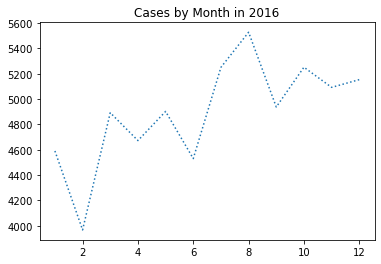

In [90]:
df_2016=df[df['year']==2016]
mon_2016=df_2016.groupby('month').size()
plt.plot(mon_2016, linestyle = 'dotted')
plt.title('Cases by Month in 2016')
plt.show()

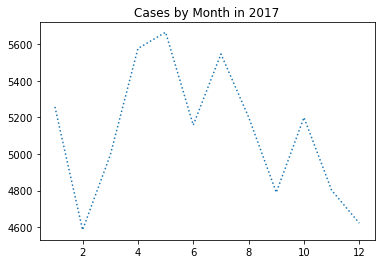

In [91]:
df_2017=df[df['year']==2017]
mon_2017=df_2017.groupby('month').size()
plt.plot(mon_2017, linestyle = 'dotted')
plt.title('Cases by Month in 2017')
plt.show()

In [92]:
def july4(year):
    """
    This function print out the top 10 number of incidents in eahc year
    :param year: The dataframe from the specific year
    >>> df_2014=df[df['year']==2014]
    >>> df_2013=df[df['year']==2013]
    >>> july4(df_2014)
    date
    2014-09-06    220
    2014-01-01    216
    2014-07-05    212
    2014-10-25    210
    2014-09-11    203
    2014-07-13    200
    2014-08-01    200
    2014-08-17    199
    2014-07-20    199
    2014-07-29    193
    dtype: int64
    >>> july4(df_2013)
    date
    2013-06-23    5
    2013-08-18    4
    2013-10-27    4
    2013-07-07    4
    2013-09-17    4
    2013-07-13    4
    2013-08-25    4
    2013-01-01    3
    2013-06-02    3
    2013-06-15    3
    dtype: int64


    """
    print(year.groupby('date').size().sort_values(ascending=False).head(10))


In [93]:
july4(df_2015)

date
2015-01-01    214
2015-07-04    211
2015-07-05    209
2015-05-17    205
2015-05-26    201
2015-05-25    201
2015-08-01    197
2015-09-27    197
2015-09-20    196
2015-08-02    195
dtype: int64


In [94]:
july4(df_2016)

date
2016-08-28    230
2016-08-21    227
2016-07-04    224
2016-01-01    221
2016-07-17    221
2016-11-27    217
2016-10-16    217
2016-09-04    216
2016-07-24    215
2016-12-31    209
dtype: int64


In [95]:
july4(df_2017)

date
2017-01-01    342
2017-07-04    248
2017-05-28    242
2017-04-16    229
2017-04-22    222
2017-10-21    220
2017-05-29    217
2017-05-27    217
2017-05-07    216
2017-02-19    216
dtype: int64


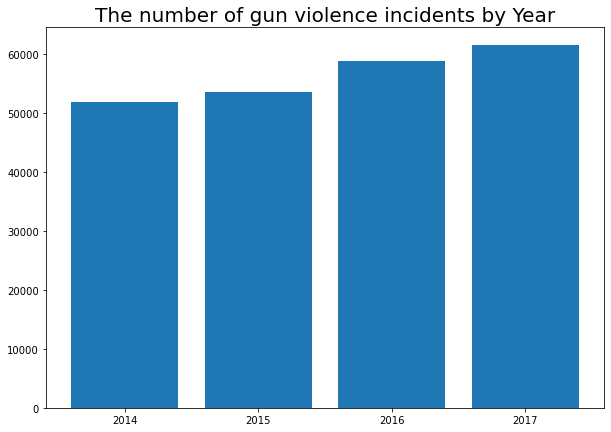

In [96]:
year_df=df.groupby('year').size().reset_index()
year_df.drop([0],inplace=True)
year_df.drop([5],inplace=True)
year_df.columns=['Year','Count']

fig = plt.figure(figsize =(10, 7))
 
# Horizontal Bar Plot
plt.bar(year_df['Year'], year_df['Count'])
plt.locator_params(integer=True)
# Show Plot
plt.title('The number of gun violence incidents by Year',fontsize=20)
plt.show()

In [97]:
df.isnull().sum()
## There are many missing values in the participant's info columns, but we are not going to clean those columns
## becuase each case might have more than one particpant.Using mode to replace missing values is not appropriate in this case

incident_id                     0
date                            0
state                           0
city_or_county                  0
n_killed                        0
n_injured                       0
year                            0
participant_gender          36362
participant_status          27626
month                           0
incident_characteristics      326
dtype: int64

In [98]:
df.groupby('state').size().sort_values(ascending=False).head(10)

#The most dangerous states between 2013 to 2018

state
Illinois          17556
California        16306
Florida           15029
Texas             13577
Ohio              10244
New York           9712
Pennsylvania       8929
Georgia            8925
North Carolina     8739
Louisiana          8103
dtype: int64

In [99]:
year_list=df.groupby('year').size().index

## The list that contain all the years.

@ipywidgets.interact(x=year_list)
def hist_plot(x):
    """
    This function is to plot the number of cases by state in different years
    :param x:The year list,contain the number of year.

    """
    top3=df[df['year']==x].groupby('state').size().sort_values(ascending=False).head(3).index
    fig_dims = (16, 14)
    fig, ax = plt.subplots(figsize=fig_dims)
    ax = sns.countplot(x=df[df['year']==x]['state'],data=df)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha="right")
    plt.title( 'Three States have most gun violence incidents : '+top3[0]+','+top3[1]+','+top3[2],fontsize=25)
    plt.suptitle('The number of cases by State in ' +str(x),fontsize=25)
    plt.xlabel('States',fontsize=15,fontweight='bold')
    plt.ylabel('Number of cases',fontsize=15)
    plt.show()

## obviously we can few states such as California , Illinois and Florida have  much higher number of cases than other States. 

interactive(children=(Dropdown(description='x', options=(2013, 2014, 2015, 2016, 2017, 2018), value=2013), Out…

In [100]:
px.scatter(df,x='n_injured',y='n_killed',size='year')
## large number of injured usually coming with the large number of killed.
## Maybe those cases was recorded from mass shooting cases.

In [101]:
def count_gender(column):
    """
    This function count the proportion of gender in all cases between 2013-2018
    and plot it as histogram
    :param column:The columns the gender
    :return:statists of gender in dataframe format
    """
    male=0
    female=0
    for line in column:
        if 'Male' or 'Female' in str(line):
            count_male=str(line).count('Male')
            male+=count_male
            count_female=str(line).count('Female')
            female+=count_female
            data = [['Male', male], ['female', female]]
    gender_data = pd.DataFrame(data, columns = ['Gender', 'count'])
    fig, ax = plt.subplots(1,1, figsize = (15,9))

    x = gender_data['Gender']
    y = gender_data['count']

    ax.bar(x, y)
    ax.set_title('Number of count in gun violence cases - By Sex', fontsize = 18)
    plt.xlabel('Sex', fontsize = 15)
    plt.ylabel('count', fontsize = 15)
    plt.show()
    return gender_data

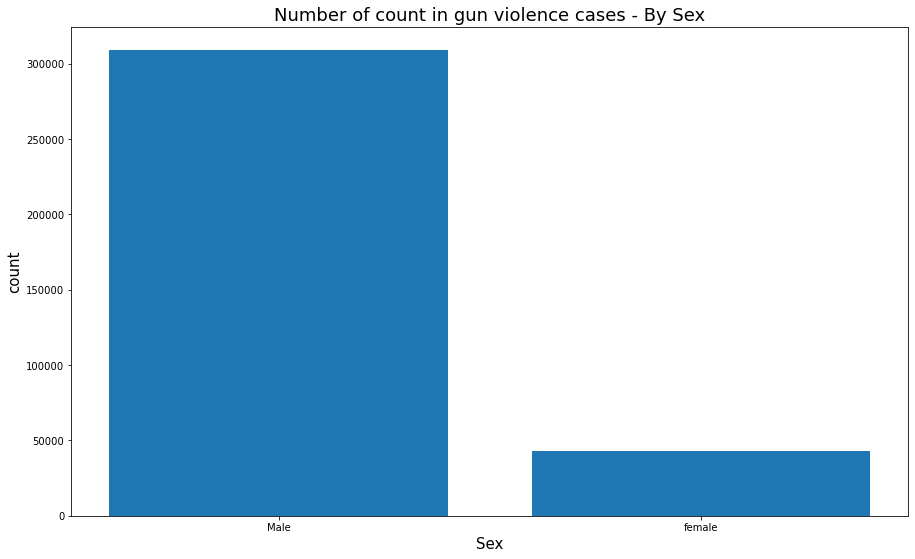

,Gender,count
0,Male,309091
1,female,43172


In [102]:
count_gender(df['participant_gender'])


In [103]:
def count_type(column):
    """
    This function is to count the incident_characteristics
    :param column: The column of incident_characteristics
    >>> count_type(df['incident_characteristics'])
    1637
    17988
    5678
    """
    mass=0
    officer=0
    gang=1
    for line in column:
        if 'Officer'in str(line):
            officer+=1
        if 'Mass Shooting'in str(line):
            mass+=1
        if 'Gang'in str(line):
            gang+=1
            
    print(mass)
    print(officer)
    print(gang)
    
    

In [104]:
number=count_type(df['incident_characteristics'])

1637
17988
5678


In [105]:
def count_status(column):
    """
    This function count the status of incidents
    :param column:The column of incidents'status 
    :return: The statistics of incident status in dataframe format
    """
    arrested=0
    killed=0
    injured=0
    unharmed=0
    for line in column:
        if 'Injured' or 'Arrested'or'killed'or'Unharmed' in str(line):
            count_arrest=str(line).count('Arrested')
            arrested+=count_arrest
            
            count_killed=str(line).count('Killed')
            killed+=count_killed
            
            count_injured=str(line).count('Injured')
            injured+=count_injured
            
            count_unharmed=str(line).count('Unharmed')
            unharmed+=count_unharmed
    total=arrested+killed+injured+unharmed
    status = [['Killed', killed,killed/total*100], ['Arrested', arrested,arrested/total*100],
              ['Injured', injured,injured/total*100],['Unharmed', unharmed,unharmed/total*100]]
    status_data = pd.DataFrame(status, columns = ['Status', 'Count','percentage'])
    
    print("total cases",total)
    
    
    labels = status_data['Status']
    sizes = status_data['percentage']
    explode = (0.2,0,0,0)

    fig1, ax1 = plt.subplots(figsize = (15,9))

    wedges, texts, autotexts =  ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
            shadow=True, startangle=90)

    ax1.axis('equal')

    ax1.legend(wedges, labels,
              title="Age Groups",
              loc="center left")

    plt.setp(autotexts, size = 15, weight = "bold") 
    ax1.set_title("Participant status", fontsize = 18)

    plt.show()
    
    return status_data
        

total cases 468589


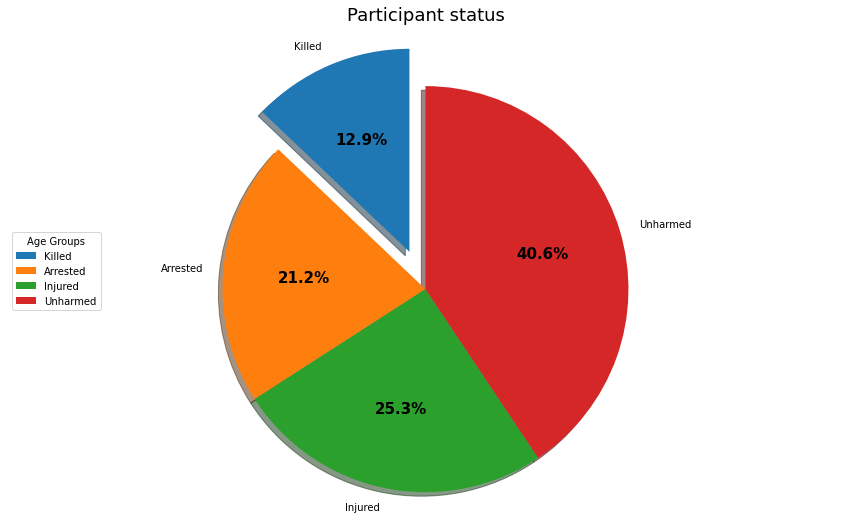

,Status,Count,percentage
0,Killed,60478,12.906406
1,Arrested,99333,21.198321
2,Injured,118395,25.266278
3,Unharmed,190383,40.628995


In [106]:
count_status(df['participant_status'])

In [107]:
state=df.groupby('state').size()
state_df=state.reset_index()
state_df.columns = ['State', 'count']


In [108]:
us_state_abbrev = {
    'Alabama': 'AL',
    'Alaska': 'AK',
    'American Samoa': 'AS',
    'Arizona': 'AZ',
    'Arkansas': 'AR',
    'California': 'CA',
    'Colorado': 'CO',
    'Connecticut': 'CT',
    'Delaware': 'DE',
    'District of Columbia': 'DC',
    'Florida': 'FL',
    'Georgia': 'GA',
    'Guam': 'GU',
    'Hawaii': 'HI',
    'Idaho': 'ID',
    'Illinois': 'IL',
    'Indiana': 'IN',
    'Iowa': 'IA',
    'Kansas': 'KS',
    'Kentucky': 'KY',
    'Louisiana': 'LA',
    'Maine': 'ME',
    'Maryland': 'MD',
    'Massachusetts': 'MA',
    'Michigan': 'MI',
    'Minnesota': 'MN',
    'Mississippi': 'MS',
    'Missouri': 'MO',
    'Montana': 'MT',
    'Nebraska': 'NE',
    'Nevada': 'NV',
    'New Hampshire': 'NH',
    'New Jersey': 'NJ',
    'New Mexico': 'NM',
    'New York': 'NY',
    'North Carolina': 'NC',
    'North Dakota': 'ND',
    'Northern Mariana Islands':'MP',
    'Ohio': 'OH',
    'Oklahoma': 'OK',
    'Oregon': 'OR',
    'Pennsylvania': 'PA',
    'Puerto Rico': 'PR',
    'Rhode Island': 'RI',
    'South Carolina': 'SC',
    'South Dakota': 'SD',
    'Tennessee': 'TN',
    'Texas': 'TX',
    'Utah': 'UT',
    'Vermont': 'VT',
    'Virgin Islands': 'VI',
    'Virginia': 'VA',
    'Washington': 'WA',
    'West Virginia': 'WV',
    'Wisconsin': 'WI',
    'Wyoming': 'WY'
}
state_df['abbrev'] = state_df['State'].map(us_state_abbrev)
state_df

,State,count,abbrev
0,Alabama,5471,AL
1,Alaska,1349,AK
2,Arizona,2328,AZ
3,Arkansas,2842,AR
4,California,16306,CA
5,Colorado,3201,CO
6,Connecticut,3067,CT
7,Delaware,1685,DE
8,District of Columbia,3195,DC
9,Florida,15029,FL


In [109]:
def incident_map(data):
    """
    This function plot the choropleth maps of incidents by state.
    :param data:Number of incidents counts by states in dataframe
    """
    fig = px.choropleth(data,  # Input Pandas DataFrame
                        locations="abbrev",  # DataFrame column with locations
                        color="count",
                        color_continuous_scale='spectral_r',# DataFrame column with color values
                        hover_name="abbrev", # DataFrame column hover info
                        locationmode = 'USA-states',
                        scope='usa') # Set to plot as US States
    fig.add_scattergeo(
        locations=state_df['abbrev'],
        locationmode='USA-states',
        text=state_df['abbrev'],
        mode='text')
    fig.update_layout(title='The most number of gun violence incidents by States')


    fig.show()

In [110]:
incident_map(state_df)

In [111]:
zip_2017=zip_code
final_2017=zip_2017[['incident_id','date','address','state','city_or_county','n_killed','n_injured','zip']]


In [112]:
final_2017.isnull().sum()
# we found there are 1771 zip code is null values, let's check it out

incident_id          0
date                 0
address           3510
state                0
city_or_county       0
n_killed             0
n_injured            0
zip               1771
dtype: int64

In [113]:
final_2017.groupby('zip').size().sort_values(ascending=False).head(10)
## The zip code number 27410 have too many cases, this is not normal. Let's check it out
## But first we may deal with the nan, None values first

zip
27410      2028
None       1953
27410.0     911
27410.0     572
60644       122
20019       116
20020       115
61605       108
60624       105
60623       102
dtype: int64

In [114]:
zip_clean=final_2017[(final_2017['zip']!='None')& (final_2017['zip'].notnull())]
zip_clean
# we selected the rows that didn't contain null values and "None" on zipcode


,incident_id,date,address,state,city_or_county,n_killed,n_injured,zip
0,740176,2017-01-01,3000 block of Danville Road,Tennessee,Memphis,1,0,38118
1,741857,2017-01-01,N 24th St and Sprague St,Nebraska,Omaha,0,0,68111
2,741852,2017-01-01,S 27th St and Polk St,Nebraska,Omaha,0,1,68107
3,740911,2017-01-01,2134 Glendale Ave,Pennsylvania,Erie,0,1,16510
4,744584,2017-01-01,200 block of S Knoxville St,New Mexico,Portales,0,0,88130
...,...,...,...,...,...,...,...,...
61396,1018014,2017-12-31,200 Block of E Liberty St,South Carolina,Florence,0,0,29506
61397,1019711,2017-12-31,5703 Cape Harbour Dr,Florida,Cape Coral,0,0,33914
61398,1020965,2017-12-31,170 Beach Dr NE,Florida,Saint Petersburg,0,1,33701
61399,1018101,2017-12-31,1900 S Sawyer Ave,Illinois,Chicago,0,1,60623


In [115]:
zip_clean[zip_clean['address'].isnull()]

# Now we knew the columns who doesn't have addresss will output the zipcode of 27410
# we decided to remove these rows since the zipcodes are incorrect may affect the result of our analyst

,incident_id,date,address,state,city_or_county,n_killed,n_injured,zip
21,740152,2017-01-01,NaN,California,Madera,0,0,27410
36,741890,2017-01-01,NaN,Florida,Boynton Beach,0,0,27410
37,740154,2017-01-01,NaN,Kentucky,Middlesboro,0,0,27410
46,740094,2017-01-01,NaN,Washington,Spanaway,0,0,27410
57,839051,2017-01-01,NaN,Wisconsin,Appleton,0,0,27410
...,...,...,...,...,...,...,...,...
61289,1019020,2017-12-31,NaN,Mississippi,Cleveland,1,0,27410
61304,1036643,2017-12-31,NaN,New York,Bronx,0,1,27410
61343,1018726,2017-12-31,NaN,Hawaii,Mililani,0,0,27410
61351,1020748,2017-12-31,NaN,Texas,Houston,0,0,27410


In [116]:
zip_clean=zip_clean[zip_clean['address'].notnull()]
zip_clean.groupby('zip').size().sort_values(ascending=False)
## The zip code looks more better , but some of them have decimal point 

zip
60644      122
20019      116
20020      115
61605      108
60624      105
          ... 
34667        1
34639.0      1
34638        1
34613.0      1
1010.0       1
Length: 17315, dtype: int64

In [117]:
zip_clean[pd.to_numeric(zip_clean['zip'], errors='coerce').isnull()]

## remove those rows too

,incident_id,date,address,state,city_or_county,n_killed,n_injured,zip
13315,801268,2017-03-23,Heppsie Mountain Road,Oregon,Eagle Point,1,0,S10 2TN
20071,833620,2017-04-29,1400 Block of Babcock Rd,Texas,San Antonio,0,0,C:\Users\DELL\PycharmProjects\pythonProject\ve...


In [118]:
zip_clean.drop([13315],inplace=True)
zip_clean.drop([20071],inplace=True)

/Users/dannyqiu/anaconda3/envs/DataViz/lib/python3.8/site-packages/pandas/core/frame.py:4160: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [119]:
zip_clean['zip']=zip_clean['zip'] = zip_clean['zip'].astype(str).replace('\.0', '', regex=True)
## we corrected the rows who has decimal point in zipcode. we didn't remove the rows because we found the zip code was correct base on their address.

<ipython-input-119-16401766ed37>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [120]:
zip_clean.isnull().sum()
## Now the data was cleaned

incident_id       0
date              0
address           0
state             0
city_or_county    0
n_killed          0
n_injured         0
zip               0
dtype: int64

In [122]:
zip_clean
# This dataframe will output as "IS597_zip_cleaned.csv"
# please continue to look up other py files for hypothesis 

,incident_id,date,address,state,city_or_county,n_killed,n_injured,zip
0,740176,2017-01-01,3000 block of Danville Road,Tennessee,Memphis,1,0,38118
1,741857,2017-01-01,N 24th St and Sprague St,Nebraska,Omaha,0,0,68111
2,741852,2017-01-01,S 27th St and Polk St,Nebraska,Omaha,0,1,68107
3,740911,2017-01-01,2134 Glendale Ave,Pennsylvania,Erie,0,1,16510
4,744584,2017-01-01,200 block of S Knoxville St,New Mexico,Portales,0,0,88130
...,...,...,...,...,...,...,...,...
61396,1018014,2017-12-31,200 Block of E Liberty St,South Carolina,Florence,0,0,29506
61397,1019711,2017-12-31,5703 Cape Harbour Dr,Florida,Cape Coral,0,0,33914
61398,1020965,2017-12-31,170 Beach Dr NE,Florida,Saint Petersburg,0,1,33701
61399,1018101,2017-12-31,1900 S Sawyer Ave,Illinois,Chicago,0,1,60623
